In [15]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 

## 데이터셋 로드 

In [16]:
# 데이터셋 로드 
df = pd.read_csv('/Users/kibeomkim/Desktop/ai challenge/open/train.csv'); df 

,id,epitope_seq,antigen_seq,antigen_code,start_position,end_position,number_of_tested,number_of_responses,assay_method_technique,assay_group,disease_type,disease_state,reference_date,reference_journal,reference_title,reference_IRI,qualitative_label,label
0,200001,KGILSN,AFKGILSNADIKAAEAACFKEGSFDEDGFYAKVGLDAFSADELKKL...,P02622.1,3.0,8.0,NaN,NaN,antigen inhibition,qualitative binding,Occurrence of allergy,allergic disease,1976,Int Arch Allergy Appl Immunol,The allergenic structure of allergen M from co...,http://www.iedb.org/reference/1005599,Positive,1
1,200002,SNADIK,AFKGILSNADIKAAEAACFKEGSFDEDGFYAKVGLDAFSADELKKL...,P02622.1,7.0,12.0,NaN,NaN,antigen inhibition,qualitative binding,Occurrence of allergy,allergic disease,1976,Int Arch Allergy Appl Immunol,The allergenic structure of allergen M from co...,http://www.iedb.org/reference/1005599,Positive,1
2,200003,EGSFDEDGFYAKVGLDAFSADELK,AFKGILSNADIKAAEAACFKEGSFDEDGFYAKVGLDAFSADELKKL...,P02622.1,21.0,44.0,NaN,NaN,antigen inhibition,qualitative binding,Occurrence of allergy,allergic disease,1976,Int Arch Allergy Appl Immunol,The allergenic structure of allergen M from co...,http://www.iedb.org/reference/1005599,Positive,1
3,200004,SFDEDGFY,AFKGILSNADIKAAEAACFKEGSFDEDGFYAKVGLDAFSADELKKL...,P02622.1,23.0,30.0,NaN,NaN,antigen inhibition,qualitative binding,Occurrence of allergy,allergic disease,1976,Int Arch Allergy Appl Immunol,The allergenic structure of allergen M from co...,http://www.iedb.org/reference/1005599,Positive,1
4,200005,DEDGFY,AFKGILSNADIKAAEAACFKEGSFDEDGFYAKVGLDAFSADELKKL...,P02622.1,25.0,30.0,NaN,NaN,antigen inhibition,qualitative binding,Occurrence of allergy,allergic disease,1976,Int Arch Allergy Appl Immunol,The allergenic structure of allergen M from co...,http://www.iedb.org/reference/1005599,Positive,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190806,390807,QQFKRELRNLPQQCGLRAPQRCDLEVESGGRDRY,MAKLTILVALALFLLAAHASARQQWELQGDRRCQSQLERANLRPCE...,Q6PSU2.2,139.0,172.0,21.0,0.0,ELISA,qualitative binding,Occurrence of allergy,peanut allergy,2022,J Allergy Clin Immunol,Immunodominant conformational and linear IgE e...,http://www.iedb.org/reference/1040321,Negative,0
190807,390808,RCMCEALQQIMENQSDRLQGRQQE,MAKLTILVALALFLLAAHASARQQWELQGDRRCQSQLERANLRPCE...,Q6PSU2.2,115.0,138.0,NaN,NaN,antigen inhibition,qualitative binding,Occurrence of allergy,peanut allergy,2022,J Allergy Clin Immunol,Immunodominant conformational and linear IgE e...,http://www.iedb.org/reference/1040321,Positive,1
190808,390809,QRDEDSYGRDPYSPSQDPYSPSPYDRRGAGSSQHQERCCNELNEFENNQ,MAKLTILVALALFLLAAHASARQQWELQGDRRCQSQLERANLRPCE...,QHN95793.1,54.0,102.0,NaN,NaN,antigen inhibition,qualitative binding,Occurrence of allergy,peanut allergy,2022,J Allergy Clin Immunol,Immunodominant conformational and linear IgE e...,http://www.iedb.org/reference/1040321,Positive,1
190809,390810,RQQWELQGDRRCQSQLERANLRPCEQHLMQKI,MAKLTILVALALFLLAAHASARQQWELQGDRRCQSQLERANLRPCE...,Q6PSU2.2,22.0,53.0,NaN,NaN,antigen inhibition,qualitative binding,Occurrence of allergy,peanut allergy,2022,J Allergy Clin Immunol,Immunodominant conformational and linear IgE e...,http://www.iedb.org/reference/1040321,Positive,1


## Null 값 점검 

In [17]:
# null 값 점검 
df.isnull().sum() # number of tested, number of responses, disease_state 에서 null 값 발견 

id                             0
epitope_seq                    0
antigen_seq                    0
antigen_code                   0
start_position                 0
end_position                   0
number_of_tested          151613
number_of_responses       152458
assay_method_technique         0
assay_group                    0
disease_type                   0
disease_state              10018
reference_date                 0
reference_journal              0
reference_title                0
reference_IRI                  0
qualitative_label              0
label                          0
dtype: int64

## 컬럼 데이터 별 자료형 확인 

In [18]:
# 컬럼 데이터 별 자료형 확인 
df.dtypes

id                          int64
epitope_seq                object
antigen_seq                object
antigen_code               object
start_position            float64
end_position              float64
number_of_tested          float64
number_of_responses       float64
assay_method_technique     object
assay_group                object
disease_type               object
disease_state              object
reference_date              int64
reference_journal          object
reference_title            object
reference_IRI              object
qualitative_label          object
label                       int64
dtype: object

## 종속변수 (label) 분포 체크 

In [21]:
# 종속변수(label) 분포 체크 
result

label
0        173959
1         16852
dtype: int64

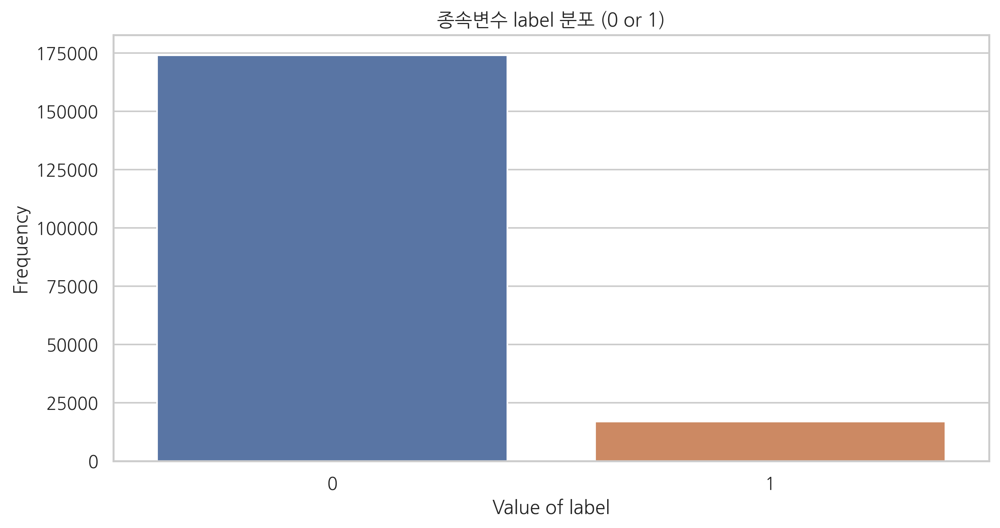

In [23]:
# 시각화 
result = df[['label']].value_counts()

plt.figure(figsize=(10,5))
sns.barplot([0,1], list(result.values))
plt.title('종속변수 label 분포 (0 or 1)')
plt.xlabel('Value of label')
plt.ylabel('Frequency')
plt.show()

## 명목형 변수 빈도 살펴보기: antigen_code

In [24]:
# 데이터셋에 포함된 antigen_code 별 빈도의 평균; 총 antigen code 수가 너무 많아서(약 20만 건), 평균 빈도 이상 등장하는 antigen code 값들의 빈도만 나타내겠다. 
count_mean = np.mean(df['antigen_code'].value_counts().values);count_mean

41.82617273125822

In [25]:
df2 = pd.DataFrame(df['antigen_code'].value_counts()).query(f'antigen_code > {count_mean}')
df3 = df2.reset_index()

In [26]:
plt.figure(figsize=(100,50))
plt.bar(df3['index'].values, df3['antigen_code'].values)
plt.title('column name: antigen_code; frequency > 41.826(frequency mean)')
plt.xlabel('antigen code (frequency > 41.8)')
plt.ylabel('Frequency')
plt.show()

## 명목형 변수 빈도 살펴보기: epitope_seq

In [27]:
result = pd.DataFrame(df['epitope_seq'].value_counts()); result
df4 = result.reset_index() 

In [28]:
# epitope sequence 별 빈도의 평균값 
np.mean(df4['epitope_seq'].values) # 평균값 

1.0057770866826556

In [29]:
# epitope sequence 별 빈도의 평균값 보다 빈도 높은 epitope sequence 의 빈도만 시각화 
df4 = df4.query('epitope_seq > 1.0057770866826556')
plt.figure(figsize=(100, 50))
plt.bar(df4['index'].values, df4['epitope_seq'].values)
plt.xlabel('epitope_seq')
plt.ylabel('frequency')
plt.title('column name: epitope_seq; frequency > 1.00577(frequency mean)')
plt.show()

## Antigen sequence 별 길이 

In [30]:
antigen_seq_unique = list(set(df['antigen_seq'].values)) ; antigen_seq_unique 
# 총 antigen sequence 갯수: 4377
print(len(antigen_seq_unique)) 

result_dict = {}
for unique in antigen_seq_unique : 
    result_dict[unique] = len(unique)

4377


In [ ]:
# antigen sequence 별 길이 출력 
for i in result_dict : 
    print('-'*100)
    print(f'antigen_sequence : {i}')
    print(f'Antigen_seq length : {result_dict[i]}')
    print('-'*100)

In [33]:
# antigen sequence 별 길이 시각화 
# antigen_seq 에서, 각 값 식별 위해 앞 10자리만 추출 후 barplot에서 xlabel로 사용. 
len([key[1:10] for key in result_dict.keys()]) == len(result_dict.keys()) # true 
keys = [key[1:10] for key in result_dict.keys()]
plt.figure(figsize=(100, 50))
sns.barplot(keys, list(result_dict.values())) 
plt.title('The length of antigen sequence')
plt.xticks(rotation='90')
plt.xlabel('Antigen sequence name')
plt.ylabel('Length')
plt.show() 

In [34]:
result_dict
antigen_df = pd.DataFrame({
    'antigen sequence' : result_dict.keys(), 
    'length' : result_dict.values()
});antigen_df

,antigen sequence,length
0,MLGNAPSVVPNTTLGMHCGSFGSAPSNGWLKLGLVEFGGVAKLNAE...,134
1,MAYSGQGQKVQKVMVQPINLIFRYLQNRSQIQVWLYEQVNMQIEGC...,92
2,MATTEYRLSLMEQFIRAFIEIDKDNNELIDKQELTKYCQQNQMDMK...,191
3,MPIPPLRKMLGIGGDRTEKLIPGTELSNWLPGGTSTTLEPDPKQHS...,112
4,MNFAVLPPEVNSARIFAGAGLGPMLAAASAWDGLAEELHAAAGSFA...,580
...,...,...
4372,MAKQLLFNEEARKKLLSGVEQISSAVKVTLGPKGRNVLLEKGYGAP...,544
4373,MILFIIFPAIVVAVTGYNCPGGKLTALERKKIVGQNNKYRSDLING...,220
4374,MAMMMTGRVLLVCALCVLWCVAADGAVGVVSGGDDNSLKELFIPVA...,455
4375,MTQYLPPNLLALFAAREPIPFMPPVDKLPHEKKSRGYLGVAKFMAD...,448


In [37]:
# antigen sequence 별 길이 평균, 표준편차, 최솟값, 사분위수, 최댓값 
antigen_df[['length']].describe()

,length
count,4377.000000
mean,365.867718
std,421.381111
min,13.000000
25%,142.000000
50%,247.000000
75%,414.000000
max,4967.000000


## Epitope sequence 별 길이 및 길이의 기술통계값 

In [38]:
epitope_seq_unique = list(set(df['epitope_seq'].values))
epitope_seq = pd.DataFrame({
    'epitope_seq' : epitope_seq_unique 
}) 
epitope_seq

,epitope_seq
0,KNTMEHVSSSEESIISQETY
1,RCPLFSDVCLTMLKH
2,CVDSGRLPRVTWISM
3,PTATNEADLILQISC
4,KRERRI
...,...
189710,DNSKESLQDKTLSDN
189711,RISSLHEETTTGNNI
189712,LNHKEILSHIIP
189713,IDAVEKTLSQQKAEL


In [39]:
sequence_length = []
for seq in list(epitope_seq['epitope_seq'].values) : 
    sequence_length.append(len(seq))

epitope_seq['sequence_length'] = sequence_length 

In [40]:
# epitope sequence 와 그 시퀀스 길이 
epitope_seq

,epitope_seq,sequence_length
0,KNTMEHVSSSEESIISQETY,20
1,RCPLFSDVCLTMLKH,15
2,CVDSGRLPRVTWISM,15
3,PTATNEADLILQISC,15
4,KRERRI,6
...,...,...
189710,DNSKESLQDKTLSDN,15
189711,RISSLHEETTTGNNI,15
189712,LNHKEILSHIIP,12
189713,IDAVEKTLSQQKAEL,15


### epitope sequence 별 길이 분포 시각화 

Text(0.5, 1.0, 'The distribution of epitope sequence length')

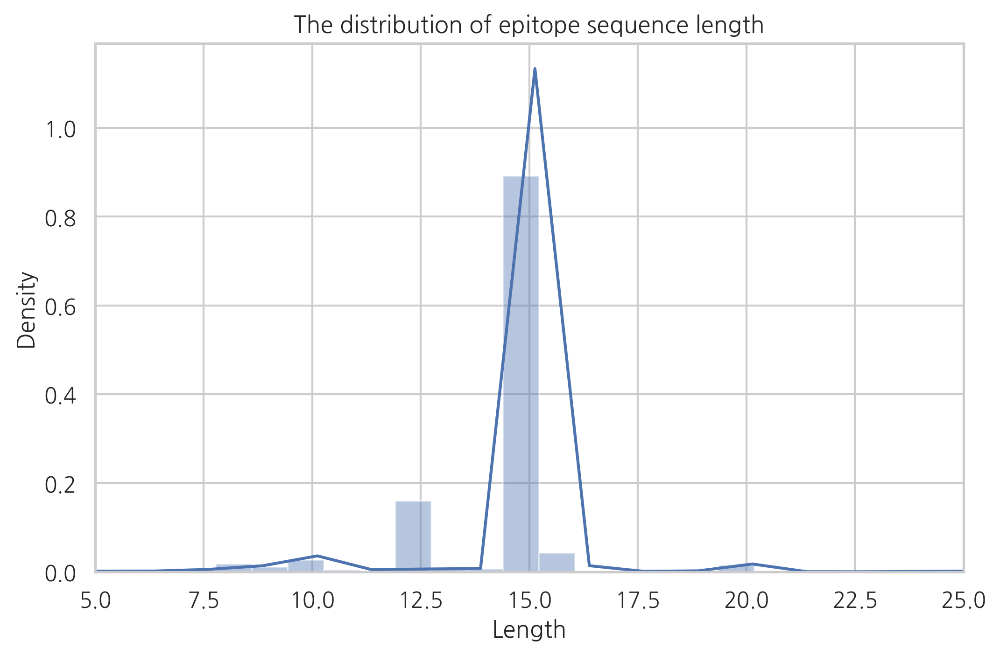

In [41]:
sns.distplot(epitope_seq['sequence_length'].values, bins=300, )
plt.xlim(5, 25)
plt.xlabel('Length')
plt.title('The distribution of epitope sequence length')

### epitope sequence 길이; 평균, 표준편차, 최솟값, 사분위수, 최댓값 

In [42]:
epitope_seq[['sequence_length']].describe()

,sequence_length
count,189715.000000
mean,14.461814
std,2.463812
min,2.000000
25%,15.000000
50%,15.000000
75%,15.000000
max,250.000000


## epitope sequence 시작위치, 끝 위치 값 기술통계

In [43]:
position_df = df[['start_position', 'end_position']]; position_df

,start_position,end_position
0,3.0,8.0
1,7.0,12.0
2,21.0,44.0
3,23.0,30.0
4,25.0,30.0
...,...,...
190806,139.0,172.0
190807,115.0,138.0
190808,54.0,102.0
190809,22.0,53.0


In [44]:
# 시작위치, 끝 위치 값 중 null 있는지 점검 
df[['start_position', 'end_position']].isnull().sum() 

start_position    0
end_position      0
dtype: int64

In [45]:
# start position, end position 값 총 갯수, 평균, 표준편차, 최솟값, 25%, 50%, 75%, 최댓값 
position_df.describe() 

,start_position,end_position
count,190811.000000,190811.000000
mean,230.326297,243.789058
std,291.516095,291.702881
min,1.000000,6.000000
25%,72.000000,85.000000
50%,159.000000,172.000000
75%,285.000000,299.000000
max,3928.000000,3943.000000


## Antigen sequence 내에서 epitope sequence 위치 

In [46]:
df[['start_position', 'end_position']]

,start_position,end_position
0,3.0,8.0
1,7.0,12.0
2,21.0,44.0
3,23.0,30.0
4,25.0,30.0
...,...,...
190806,139.0,172.0
190807,115.0,138.0
190808,54.0,102.0
190809,22.0,53.0


In [47]:
# Antigen sequence 중 최장 길이: 
max_length = max([len(sequence) for sequence in list(df['antigen_seq'].values)])
print(f'Antigen sequence 중 최장 길이: {max_length}')

Antigen sequence 중 최장 길이: 4967


In [48]:
start_list = [0]*5000

for i in range(190811) :
    epitope_sequence_range = list(range(int(list(position_df.iloc[i].values)[0]), int(list(position_df.iloc[i].values)[-1])+1))
    for epitope_index in epitope_sequence_range : 
        start_list[epitope_index] += 1

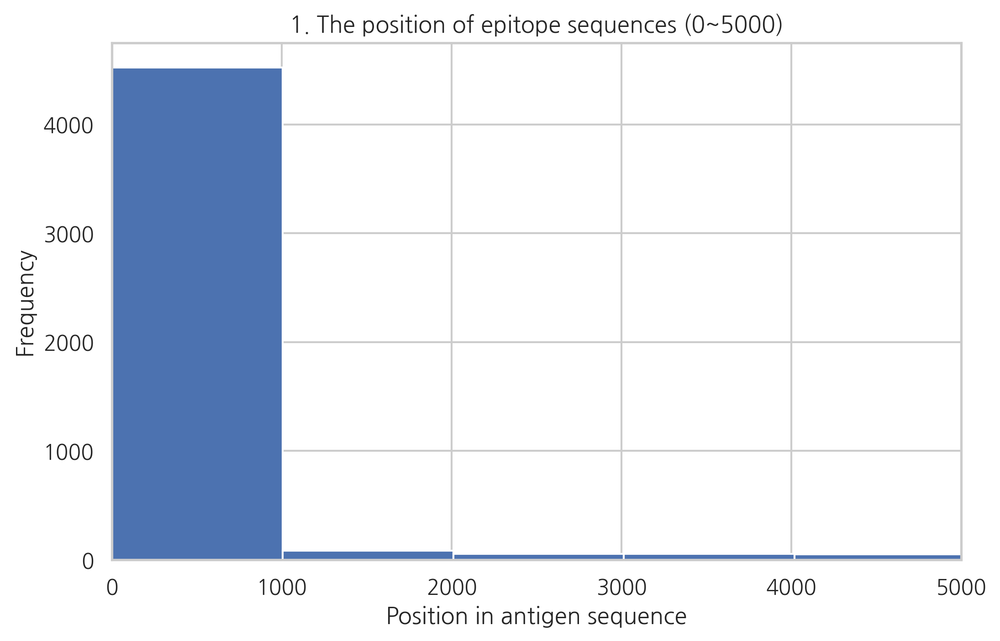

In [49]:
# antigen sequence 내에서 epitope sequence 위치 빈도별 시각화 1
plt.hist(start_list, bins=10)
plt.xlim(0, 5000)
plt.title('1. The position of epitope sequences (0~5000)')
plt.xlabel('Position in antigen sequence')
plt.ylabel('Frequency')
plt.show()

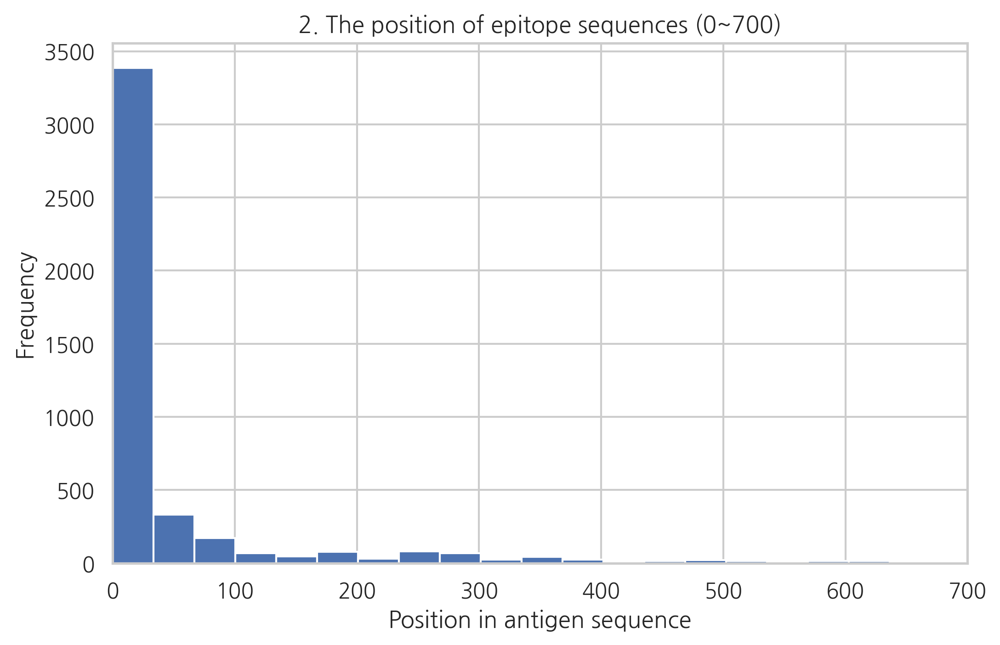

In [50]:
# antigen sequence 내에서 epitope sequence 위치 빈도별 시각화 2; 빈도 높은 구간 (0~700) 만 다시 시각화 
plt.hist(start_list, bins=300)
plt.xlim(0, 700)
plt.title('2. The position of epitope sequences (0~700)')
plt.xlabel('Position in antigen sequence')
plt.ylabel('Frequency')
plt.show()